# Fase 5: Evaluation

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import glob
import pickle
import random

import numpy as np
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, random_split

from tqdm.auto import tqdm

In [ ]:
# ==========================
# CONFIGURACIÓN
# ==========================

BASE_FOLDER = "/content/drive/MyDrive/root/UNAM/semestre9/mineria-masiva"
LABELS_CSV = "/content/drive/MyDrive/root/UNAM/semestre9/mineria-masiva/labels.csv"

OUT_FOLDER = os.path.join(BASE_FOLDER, "out")
DATA_FOLDER = os.path.join(OUT_FOLDER, "data")
os.makedirs(OUT_FOLDER, exist_ok=True)
os.makedirs(DATA_FOLDER, exist_ok=True)

MANIFEST_PATH = os.path.join(DATA_FOLDER, "manifest.csv")

EXPECTED_X = 96
EXPECTED_Y = 96
TARGET_Z   = 50

MIN_CHANNELS_TOTAL = 65   # incluye canal 0 (b0)
DIFF_CHANNELS      = 64   # canales de difusión usados (1..64)

BATCH_SIZE    = 8
NUM_EPOCHS    = 15
LEARNING_RATE = 1e-4
NUM_WORKERS   = 2

BLOCK_FRACTION = 0.2  # cada bloque ~20% de los sujetos válidos

# Mapeo binario: 0 = control sano, 1 = paciente (cualquier diagnóstico)
DIAG_TO_INT = {
    "CONTROL": 0,
    "SCHZ": 1,
    "BIPOLAR": 1,
    "ADHD": 1,
}


# Modelos Clasicos

In [ ]:
BASE_PATH = "/content/drive/MyDrive/root/UNAM/semestre9/mineria-masiva"
OUTPUT_CSV  = os.path.join(BASE_PATH,'dwi_block_features_for_svm.csv')

In [ ]:
df_feats = pd.read_csv(OUTPUT_CSV)
df_feats.head()

,subject_id,FA_BLOCK_000,FA_BLOCK_001,FA_BLOCK_002,FA_BLOCK_003,FA_BLOCK_004,FA_BLOCK_005,FA_BLOCK_006,FA_BLOCK_007,FA_BLOCK_008,...,FA_BLOCK_504,FA_BLOCK_505,FA_BLOCK_506,FA_BLOCK_507,FA_BLOCK_508,FA_BLOCK_509,FA_BLOCK_510,FA_BLOCK_511,diagnosis,label_int
0,sub-10159,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CONTROL,0
1,sub-10171,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CONTROL,0
2,sub-10189,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CONTROL,0
3,sub-10193,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CONTROL,0
4,sub-10206,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CONTROL,0


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
df_feats['label_bin'] = df_feats['diagnosis'].apply(lambda x: 0 if x == 'CONTROL' else 1)

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

In [ ]:
#recuperar los columnas FA_BLOCK
X = df_feats[df_feats.columns[df_feats.columns.str.startswith('FA_BLOCK')]]
y = df_feats['label_bin']



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

PATH_SVM = os.path.join(
    BASE_PATH,
    "out",
    "svm_model.pkl"
)
bestModelSvm = pickle.load(open(PATH_SVM, 'rb'))

In [ ]:
# evaluacion
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

              precision    recall  f1-score   support

           0       0.60      0.54      0.57        28
           1       0.52      0.58      0.55        24

    accuracy                           0.56        52
   macro avg       0.56      0.56      0.56        52
weighted avg       0.56      0.56      0.56        52



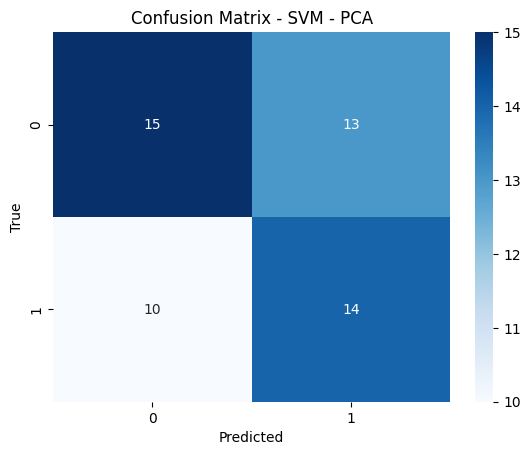

In [ ]:
y_pred = bestModelSvm.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
print(classification_report(y_test, y_pred))
plt.title('Confusion Matrix - SVM - PCA')
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

Computing t-SNE embedding...


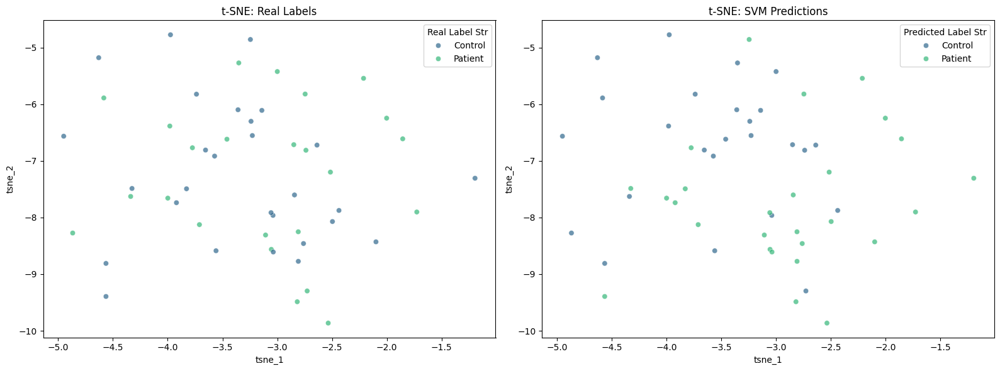

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Ensure we have predictions
y_pred = bestModelSvm.predict(X_test)

# 2. Scale X_test using the scaler from the trained pipeline
#    (It's best to visualize the scaled space the SVM operates on)
scaler = bestModelSvm.named_steps['scaler']
X_test_scaled = scaler.transform(X_test)

# 3. Compute t-SNE (reduce to 2 dimensions)
print("Computing t-SNE embedding...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30, init='pca', learning_rate='auto')
X_embedded = tsne.fit_transform(X_test_scaled)

# 4. Prepare DataFrame for plotting
df_tsne = pd.DataFrame(X_embedded, columns=['tsne_1', 'tsne_2'])
df_tsne['Real Label'] = y_test.values
df_tsne['Predicted Label'] = y_pred

# Map 0/1 to string labels for clearer legend
label_map = {0: 'Control', 1: 'Patient'}
df_tsne['Real Label Str'] = df_tsne['Real Label'].map(label_map)
df_tsne['Predicted Label Str'] = df_tsne['Predicted Label'].map(label_map)

# 5. Plot side-by-side
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Subplot 1: Real Labels
sns.scatterplot(
    data=df_tsne, x='tsne_1', y='tsne_2', hue='Real Label Str',
    palette='viridis', ax=axes[0], alpha=0.7
)
axes[0].set_title("t-SNE: Real Labels")

# Subplot 2: Predicted Labels
sns.scatterplot(
    data=df_tsne, x='tsne_1', y='tsne_2', hue='Predicted Label Str',
    palette='viridis', ax=axes[1], alpha=0.7
)
axes[1].set_title("t-SNE: SVM Predictions")

plt.tight_layout()
plt.show()

In [ ]:
# ==========================
# UTILIDADES DE CARGA
# ==========================

def find_dwi_files(base_folder):
    """
    Busca archivos *dwi*.nii* en subcarpetas de base_folder.
    Asume estructura base_folder/sub-XXXX/.../algo_dwi.nii.gz
    Devuelve dict {subject_id: path_dwi}
    """
    pattern = os.path.join(base_folder, "**", "*dwi*.nii*")
    dwi_paths = glob.glob(pattern, recursive=True)

    subjects = {}
    for dwi_path in dwi_paths:
        rel = os.path.relpath(dwi_path, base_folder)
        parts = rel.split(os.sep)
        subject_id = parts[0]
        subjects[subject_id] = dwi_path

    return subjects


def load_labels(labels_csv):
    """
    Lee labels.csv con columnas: subject_id, diagnosis
    y devuelve dict {subject_id: diagnosis_str}
    """
    df = pd.read_csv(labels_csv)
    df["subject_id"] = df["subject_id"].astype(str).str.strip()
    df["diagnosis"] = df["diagnosis"].astype(str).str.strip().str.upper()
    return dict(zip(df["subject_id"], df["diagnosis"]))


def quick_check_shape(path):
    """
    Carga solo cabecera para revisar shape (X,Y,Z,C) sin leer todo el volumen.
    Devuelve shape o None si hay problema.
    """
    try:
        img = nib.load(path)
        return img.shape
    except Exception as e:
        print(f"  ! Error cargando cabecera de {path}: {e}")
        return None


def load_and_preprocess_dwi(path):
    """
    Carga un DWI (NIfTI) y aplica reglas de shape/canales:

      - Espera data 4D (X,Y,Z,C).
      - X,Y deben ser EXPECTED_X, EXPECTED_Y.
      - Si Z < TARGET_Z -> descarta (return None).
      - Si Z > TARGET_Z -> recorta slices iniciales en Z.
      - Si C < MIN_CHANNELS_TOTAL -> descarta.
      - Elimina canal 0 (b0) y usa canales 1..(1+DIFF_CHANNELS-1).
      - Normaliza z-score sobre voxels > 0.
      - Reordena a (C, D, H, W).

    Devuelve:
      tensor float32 de shape (C, D, H, W)
      o None si el volumen se descarta.
    """
    img = nib.load(path)
    data = img.get_fdata()  # (X,Y,Z,C)

    if data.ndim != 4:
        print(f"  ! {path}: no es 4D, se descarta.")
        return None

    x, y, z, c = data.shape

    if x != EXPECTED_X or y != EXPECTED_Y:
        print(f"  ! {path}: XY={x}x{y} distinto de {EXPECTED_X}x{EXPECTED_Y}, se descarta.")
        return None

    if z < TARGET_Z:
        print(f"  ! {path}: Z={z} < {TARGET_Z}, se descarta.")
        return None
    elif z > TARGET_Z:
        extra = z - TARGET_Z
        data = data[:, :, extra:, :]
        z = TARGET_Z

    if c < MIN_CHANNELS_TOTAL:
        print(f"  ! {path}: C={c} < {MIN_CHANNELS_TOTAL}, se descarta.")
        return None

    # quitamos canal 0 (b0) y tomamos DIFF_CHANNELS canales de difusión
    start_ch = 1
    end_ch = start_ch + DIFF_CHANNELS  # 1..64
    if end_ch > c:
        print(f"  ! {path}: tras quitar canal 0 no hay {DIFF_CHANNELS} canales de difusión, se descarta.")
        return None

    data = data[:, :, :, start_ch:end_ch]  # (X,Y,Z,DIFF_CHANNELS)

    # Normalización z-score sobre voxels > 0
    mask = data > 0
    if np.any(mask):
        mean = data[mask].mean()
        std = data[mask].std()
        if std > 0:
            data = (data - mean) / std
        else:
            data = data - mean
    else:
        print(f"  ! {path}: todos los voxels son 0 tras recorte, se descarta.")
        return None

    # Reordenar a (C, D, H, W) → (chan, z, y, x)
    data = np.transpose(data, (3, 2, 1, 0)).astype(np.float32)

    return torch.from_numpy(data)

# ==========================
# CANDIDATOS + EXPORT POR BLOQUES
# ==========================

def discover_candidates(base_folder, labels_csv):
    """
    Descubre sujetos candidatos (por shape básico) SIN cargar el volumen completo.
    Devuelve lista de (subject_id, path, label_int).
    """
    labels_dict = load_labels(labels_csv)
    subject_to_path = find_dwi_files(base_folder)

    candidates = []

    for subj_id, path in subject_to_path.items():
        if subj_id not in labels_dict:
            continue

        diag_str = labels_dict[subj_id].upper()
        if diag_str not in DIAG_TO_INT:
            continue

        label_int = DIAG_TO_INT[diag_str]

        candidates.append((subj_id, path, label_int))

    print(f"Total sujetos candidatos (por shape/canales mínimos): {len(candidates)}")
    return candidates


def export_blocks_and_manifest(candidates, block_fraction=0.2):
    """
    Recorre la lista de candidatos, carga+preprocesa cada volumen y
    los va guardando en bloques (~20% del total) para no explotar la RAM
    al hacer un pickle gigante.

    - Exporta:
        data/block_000.pkl, block_001.pkl, ...
        Cada bloque tiene: dict(volumes, labels, subject_ids)
    - Crea manifest.csv con columnas:
        global_index, subject_id, label, block_id, index_in_block
    """
    if len(candidates) == 0:
        raise RuntimeError("No hay candidatos para exportar bloques.")

    block_size = max(1, int(len(candidates) * block_fraction))
    print(f"Usando block_size={block_size} (~{block_fraction*100:.0f}% de {len(candidates)})")

    block_id = 0
    current_vols = []
    current_labels = []
    current_subjs = []

    manifest_rows = []
    global_index = 0

    for subj_id, path, label_int in tqdm(candidates, desc="Procesando y exportando bloques", unit="subject"):
        vol = load_and_preprocess_dwi(path)
        if vol is None:
            continue

        # índice dentro del bloque actual
        index_in_block = len(current_vols)

        current_vols.append(vol)
        current_labels.append(label_int)
        current_subjs.append(subj_id)

        # fila de bitácora
        manifest_rows.append({
            "global_index": global_index,
            "subject_id": subj_id,
            "label": label_int,
            "block_id": block_id,
            "index_in_block": index_in_block
        })
        global_index += 1

        # si el bloque llegó al tamaño, lo guardamos y limpiamos buffers
        if len(current_vols) >= block_size:
            block_path = os.path.join(DATA_FOLDER, f"block_{block_id:03d}.pkl")
            with open(block_path, "wb") as f:
                pickle.dump({
                    "volumes": current_vols,
                    "labels": current_labels,
                    "subject_ids": current_subjs,
                }, f)
            print(f"  -> Guardado bloque {block_id} con {len(current_vols)} sujetos en {block_path}")

            block_id += 1
            current_vols = []
            current_labels = []
            current_subjs = []

    # guardar bloque final (si quedó algo)
    if len(current_vols) > 0:
        block_path = os.path.join(DATA_FOLDER, f"block_{block_id:03d}.pkl")
        with open(block_path, "wb") as f:
            pickle.dump({
                "volumes": current_vols,
                "labels": current_labels,
                "subject_ids": current_subjs,
            }, f)
        print(f"  -> Guardado bloque final {block_id} con {len(current_vols)} sujetos en {block_path}")

    # guardar manifest
    df_manifest = pd.DataFrame(manifest_rows)
    df_manifest.to_csv(MANIFEST_PATH, index=False)
    print(f"Bitácora guardada en {MANIFEST_PATH}")
    print(f"Total sujetos válidos exportados: {len(manifest_rows)}")


def list_block_files():
    """
    Devuelve lista ordenada de paths a bloques block_XXX.pkl
    """
    pattern = os.path.join(DATA_FOLDER, "block_*.pkl")
    files = sorted(glob.glob(pattern))
    return files

def load_all_blocks_to_ram():
    """
    Carga TODOS los bloques block_XXX.pkl a RAM y devuelve:
      volumes: lista de tensores (C,D,H,W)
      labels : lista de ints
    (Los subject_ids se guardan en los bloques y en manifest.csv,
     pero para entrenamiento sólo necesitamos volumes+labels.)
    """
    block_files = list_block_files()
    if not block_files:
        raise RuntimeError("No hay bloques block_*.pkl en data/. Primero ejecuta export_blocks_and_manifest.")

    all_volumes = []
    all_labels = []

    print("Cargando todos los bloques a RAM...")
    for block_path in tqdm(block_files, desc="Cargando bloques", unit="block"):
        with open(block_path, "rb") as f:
            data = pickle.load(f)
        vols_b = data["volumes"]
        labels_b = data["labels"]
        all_volumes.extend(vols_b)
        all_labels.extend(labels_b)

    print(f"Total sujetos cargados desde bloques: {len(all_volumes)}")
    return all_volumes, all_labels

## CNN 3

In [ ]:
volumes, labels = load_all_blocks_to_ram()

Cargando todos los bloques a RAM...


Cargando bloques:   0%|          | 0/5 [00:00<?, ?block/s]

Total sujetos cargados desde bloques: 258


In [ ]:
# ==========================
# DATASET EN MEMORIA
# ==========================
class InMemoryDWIDataset(Dataset):
    """
    Dataset simple que asume que los volúmenes ya están cargados en RAM.
    volumes: lista de tensores (C,D,H,W)
    labels:  lista de ints
    """

    def __init__(self, volumes, labels):
        assert len(volumes) == len(labels)
        self.volumes = volumes
        self.labels = labels

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        return self.volumes[idx], self.labels[idx]

In [ ]:
class ImprovedCNN3D(nn.Module):
    """
    CNN 3D mejorada con técnicas de regularización para evitar overfitting:
    - Dropout en múltiples etapas
    - Batch Normalization
    - Conexiones residuales (skip connections)
    - Data augmentation implícita (usar durante training)
    - Regularización L2 (weight decay en optimizer)
    """
    def __init__(self, in_channels=64, num_classes=2, dropout_rate=0.2):
        super().__init__()

        # ========================================
        # BLOQUE 1: Extracción inicial de características
        # ========================================
        self.block1 = nn.Sequential(
            nn.Conv3d(in_channels, 32, kernel_size=3, stride=1, padding=1),  # Padding=1 para mantener tamaño
            nn.BatchNorm3d(32),
            nn.ReLU(inplace=True),
            nn.Dropout3d(p=0.1),  # Dropout ligero inicial
        )

        # ========================================
        # BLOQUE 2: Profundización con MaxPool
        # ========================================
        self.block2 = nn.Sequential(
            nn.Conv3d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm3d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool3d(kernel_size=2, stride=2),  # Reduce dimensiones a la mitad
            nn.Dropout3d(p=0.1),  # Dropout moderado
        )

        # ========================================
        # BLOQUE 3: Características de alto nivel
        # ========================================
        self.block3 = nn.Sequential(
            nn.Conv3d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm3d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool3d(kernel_size=2, stride=2),  # Reduce dimensiones nuevamente
            nn.Dropout3d(p=0.1),  # Dropout más agresivo
        )

        # ========================================
        # BLOQUE 4: Refinamiento final
        # ========================================
        self.block4 = nn.Sequential(
            nn.Conv3d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm3d(256),
            nn.ReLU(inplace=True),
            nn.Dropout3d(p=0.1),
        )

        # ========================================
        # POOLING GLOBAL
        # ========================================
        self.global_pool = nn.AdaptiveAvgPool3d(1)

        # ========================================
        # CLASIFICADOR con Dropout
        # ========================================
        self.classifier = nn.Sequential(
            nn.Linear(256, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_rate),  # Dropout fuerte antes de clasificación
            nn.Linear(128, num_classes)
        )

        # Inicialización de pesos (He initialization para ReLU)
        self._initialize_weights()

    def _initialize_weights(self):
        """Inicialización de pesos para mejor convergencia"""
        for m in self.modules():
            if isinstance(m, nn.Conv3d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.BatchNorm3d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.01)
                nn.init.constant_(m.bias, 0)

    def forward(self, x):
        # x shape: (Batch, Channels, Depth, Height, Width)
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)

        x = self.global_pool(x)        # -> (Batch, 256, 1, 1, 1)
        x = torch.flatten(x, 1)        # -> (Batch, 256)
        x = self.classifier(x)         # -> (Batch, num_classes)

        return x

In [ ]:
modeloImprove = ImprovedCNN3D()
modeloImprove.load_state_dict(
    torch.load("/content/drive/MyDrive/root/UNAM/semestre9/mineria-masiva/out/v2_cnn.pth")
)
print(modeloImprove)

ImprovedCNN3D(
  (block1): Sequential(
    (0): Conv3d(64, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Dropout3d(p=0.1, inplace=False)
  )
  (block2): Sequential(
    (0): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Dropout3d(p=0.1, inplace=False)
  )
  (block3): Sequential(
    (0): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
    (1): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Dropout3d(p=0.1, inplace=False)
  )
  (bl

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dataset = InMemoryDWIDataset(volumes, labels)
total = len(dataset)

# ---- PARTICIÓN 80% TRAIN, 10% VAL, 10% TEST ----
n_train = int(0.8 * total)
n_val   = int(0.1 * total)
n_test  = total - n_train - n_val   # suma exacta

train_ds, val_ds, test_ds = random_split(
    dataset,
    [n_train, n_val, n_test],
    generator=torch.Generator().manual_seed(42)
)

print(f"Train: {len(train_ds)}  |  Val: {len(val_ds)}  |  Test: {len(test_ds)}")

Train: 206  |  Val: 25  |  Test: 27


In [ ]:
# ========================================
# 2. EXTRAER ACTIVACIONES DE LA PRIMERA CAPA
# ========================================
def obtener_activaciones_capa(model, input_tensor, layer_name='block1'):
    """
    Extrae las activaciones de cualquier bloque del modelo mejorado

    Args:
        model: Modelo ImprovedCNN3D, ImprovedCNN3D_WithResidual o LightweightCNN3D
        input_tensor: Tensor de entrada (B, C, D, H, W) o (C, D, H, W)
        layer_name: Nombre del bloque a extraer ('block1', 'block2', 'block3', 'block4')

    Returns:
        activaciones: Tensor (B, num_filtros, D_out, H_out, W_out)
    """
    # Asegurar que tiene dimensión batch
    if input_tensor.dim() == 4:
        input_tensor = input_tensor.unsqueeze(0)  # (1, C, D, H, W)

    model.eval()

    with torch.no_grad():
        # Obtener el bloque específico
        if hasattr(model, layer_name):
            block = getattr(model, layer_name)
            activaciones = block(input_tensor)
        else:
            raise ValueError(f"El modelo no tiene el bloque '{layer_name}'")

    return activaciones

# ========================================
# 3. FUNCIÓN DE VISUALIZACIÓN POR SLICES
# ========================================
def visualizar_activaciones_por_slice(activaciones, slice_idx, max_filtros=16,
                                      cmap='viridis', figsize=(20, 12)):
    """
    Visualiza las activaciones de múltiples filtros en un slice específico

    Args:
        activaciones: Tensor (B, num_filtros, D, H, W)
        slice_idx: Índice del slice en profundidad a visualizar
        max_filtros: Número máximo de filtros a mostrar
        cmap: Colormap de matplotlib
        figsize: Tamaño de la figura
    """
    # Remover dimensión batch si existe
    if activaciones.dim() == 5:
        activaciones = activaciones[0]  # (num_filtros, D, H, W)

    num_filtros = activaciones.shape[0]
    num_filtros = min(num_filtros, max_filtros)

    # Calcular grid
    cols = 4
    rows = (num_filtros + cols - 1) // cols

    fig = plt.figure(figsize=figsize)
    fig.suptitle(f'Activaciones de Primera Capa Convolucional - Slice {slice_idx}/{activaciones.shape[1]}',
                 fontsize=16, fontweight='bold')

    for i in range(num_filtros):
        ax = fig.add_subplot(rows, cols, i + 1)

        # Extraer slice del filtro i
        activation_slice = activaciones[i, slice_idx, :, :].cpu().numpy()

        # Visualizar
        im = ax.imshow(activation_slice, cmap=cmap, aspect='auto')
        ax.set_title(f'Filtro {i}', fontsize=10)
        ax.axis('off')

        # Añadir colorbar
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

        # Estadísticas
        ax.text(0.02, 0.98, f'Min: {activation_slice.min():.2f}\nMax: {activation_slice.max():.2f}',
                transform=ax.transAxes, fontsize=8, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()


# ========================================
# 4. VISUALIZACIÓN COMPARATIVA: INPUT vs ACTIVACIONES
# ========================================
def comparar_input_vs_activaciones(input_tensor, activaciones,
                                   slice_idx, canal_input=0, filtro_idx=0):
    """
    Compara un canal del input con la activación de un filtro específico

    Args:
        input_tensor: Tensor de entrada (C, D, H, W) o (1, C, D, H, W)
        activaciones: Tensor de activaciones (num_filtros, D_out, H_out, W_out)
        slice_idx: Índice del slice a visualizar
        canal_input: Canal del input a mostrar
        filtro_idx: Índice del filtro a mostrar
    """
    # Preparar input
    if input_tensor.dim() == 5:
        input_tensor = input_tensor[0]

    if activaciones.dim() == 5:
        activaciones = activaciones[0]

    fig, axes = plt.subplots(1, 2, figsize=(15, 6))

    # Input original
    input_slice = input_tensor[canal_input, slice_idx, :, :].cpu().numpy()
    im1 = axes[0].imshow(input_slice, cmap='viridis', aspect='auto')
    axes[0].set_title(f'Input - Canal {canal_input} - Slice {slice_idx}', fontsize=12, fontweight='bold')
    axes[0].axis('off')
    plt.colorbar(im1, ax=axes[0], fraction=0.046, pad=0.04)

    # Activación
    activation_slice = activaciones[filtro_idx, slice_idx, :, :].cpu().numpy()
    im2 = axes[1].imshow(activation_slice, cmap='viridis', aspect='auto')
    axes[1].set_title(f'Activación - Filtro {filtro_idx} - Slice {slice_idx}', fontsize=12, fontweight='bold')
    axes[1].axis('off')
    plt.colorbar(im2, ax=axes[1], fraction=0.046, pad=0.04)

    # Estadísticas
    axes[0].text(0.02, 0.98,
                 f'Shape: {input_slice.shape}\nMin: {input_slice.min():.2f}\nMax: {input_slice.max():.2f}\nMean: {input_slice.mean():.2f}',
                 transform=axes[0].transAxes, fontsize=9, verticalalignment='top',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    axes[1].text(0.02, 0.98,
                 f'Shape: {activation_slice.shape}\nMin: {activation_slice.min():.2f}\nMax: {activation_slice.max():.2f}\nMean: {activation_slice.mean():.2f}',
                 transform=axes[1].transAxes, fontsize=9, verticalalignment='top',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()


# ========================================
# 5. VISUALIZACIÓN 3D: TODOS LOS SLICES DE UN FILTRO
# ========================================
def visualizar_filtro_completo(activaciones, filtro_idx, num_slices=10, figsize=(20, 10)):
    """
    Muestra múltiples slices de un filtro específico para ver el volumen completo

    Args:
        activaciones: Tensor de activaciones (num_filtros, D, H, W)
        filtro_idx: Índice del filtro a visualizar
        num_slices: Número de slices equiespaciados a mostrar
    """
    if activaciones.dim() == 5:
        activaciones = activaciones[0]

    profundidad = activaciones.shape[1]
    slice_indices = np.linspace(0, profundidad - 1, num_slices, dtype=int)

    cols = 5
    rows = (num_slices + cols - 1) // cols

    fig = plt.figure(figsize=figsize)
    fig.suptitle(f'Filtro {filtro_idx} - Todos los Slices (Profundidad: {profundidad})',
                 fontsize=16, fontweight='bold')

    for i, slice_idx in enumerate(slice_indices):
        ax = fig.add_subplot(rows, cols, i + 1)

        activation_slice = activaciones[filtro_idx, slice_idx, :, :].cpu().numpy()

        im = ax.imshow(activation_slice, cmap='viridis', aspect='auto')
        ax.set_title(f'Slice {slice_idx}/{profundidad-1}', fontsize=10)
        ax.axis('off')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()


# ========================================
# 6. ANÁLISIS ESTADÍSTICO DE ACTIVACIONES
# ========================================
def analizar_estadisticas_filtros(activaciones):
    """
    Muestra estadísticas de todos los filtros
    """
    if activaciones.dim() == 5:
        activaciones = activaciones[0]

    num_filtros = activaciones.shape[0]

    print(f"\n{'='*70}")
    print(f"ANÁLISIS ESTADÍSTICO DE ACTIVACIONES - PRIMERA CAPA")
    print(f"{'='*70}")
    print(f"Shape de activaciones: {activaciones.shape}")
    print(f"Número de filtros: {num_filtros}")
    print(f"\n{'Filtro':<8} {'Min':<12} {'Max':<12} {'Mean':<12} {'Std':<12} {'% Activos':<12}")
    print(f"{'-'*70}")

    for i in range(num_filtros):
        filtro = activaciones[i].cpu().numpy()
        activos = (filtro > 0).sum() / filtro.size * 100

        print(f"{i:<8} {filtro.min():<12.4f} {filtro.max():<12.4f} "
              f"{filtro.mean():<12.4f} {filtro.std():<12.4f} {activos:<12.2f}")

    print(f"{'='*70}\n")


# ========================================
# 7. HEATMAP DE ACTIVACIÓN PROMEDIO
# ========================================
def visualizar_activacion_promedio_por_filtro(activaciones, figsize=(15, 8)):
    """
    Muestra un heatmap de la activación promedio de cada filtro
    """
    if activaciones.dim() == 5:
        activaciones = activaciones[0]

    num_filtros = activaciones.shape[0]

    # Calcular estadísticas por filtro
    means = []
    maxs = []
    stds = []

    for i in range(num_filtros):
        filtro = activaciones[i].cpu().numpy()
        means.append(filtro.mean())
        maxs.append(filtro.max())
        stds.append(filtro.std())

    fig, axes = plt.subplots(1, 3, figsize=figsize)

    # Mean
    axes[0].bar(range(num_filtros), means, color='steelblue')
    axes[0].set_title('Activación Media por Filtro', fontweight='bold')
    axes[0].set_xlabel('Filtro')
    axes[0].set_ylabel('Mean')
    axes[0].grid(alpha=0.3)

    # Max
    axes[1].bar(range(num_filtros), maxs, color='coral')
    axes[1].set_title('Activación Máxima por Filtro', fontweight='bold')
    axes[1].set_xlabel('Filtro')
    axes[1].set_ylabel('Max')
    axes[1].grid(alpha=0.3)

    # Std
    axes[2].bar(range(num_filtros), stds, color='mediumseagreen')
    axes[2].set_title('Desviación Estándar por Filtro', fontweight='bold')
    axes[2].set_xlabel('Filtro')
    axes[2].set_ylabel('Std')
    axes[2].grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

In [ ]:
v0 = volumes[0]
activaciones = obtener_activaciones_capa(modeloImprove, v0)

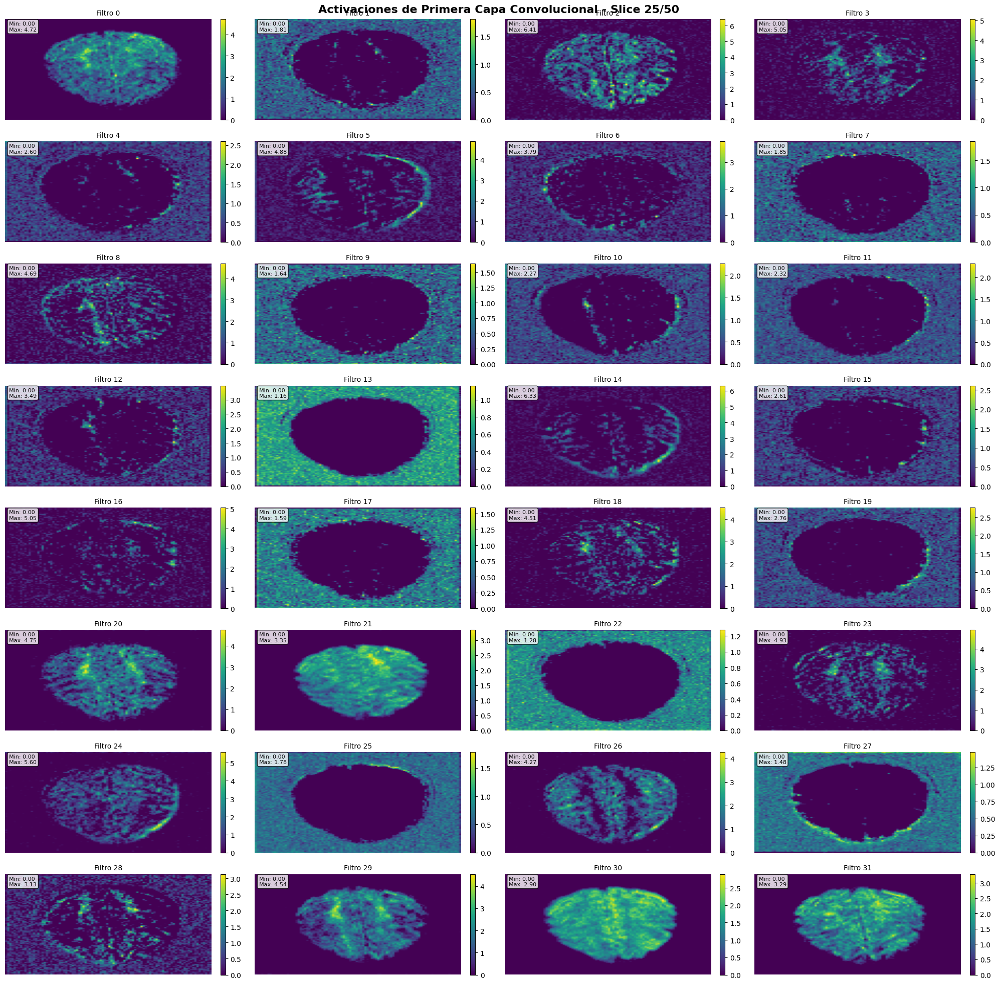

In [ ]:
slice_medio = activaciones.shape[2] // 2  # Slice del medio
visualizar_activaciones_por_slice(activaciones, slice_idx=slice_medio, max_filtros=32,figsize=(20,20))

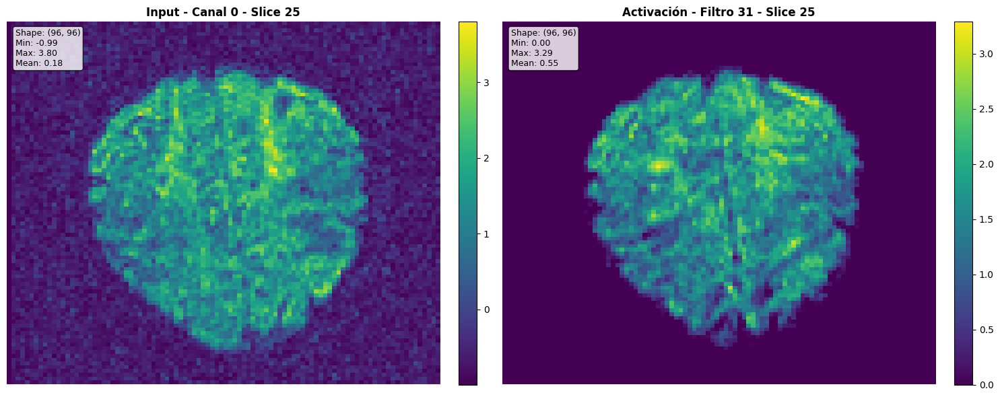

In [ ]:
comparar_input_vs_activaciones(v0, activaciones,
                                   slice_idx=slice_medio,
                                   canal_input=0,
                                   filtro_idx=31)

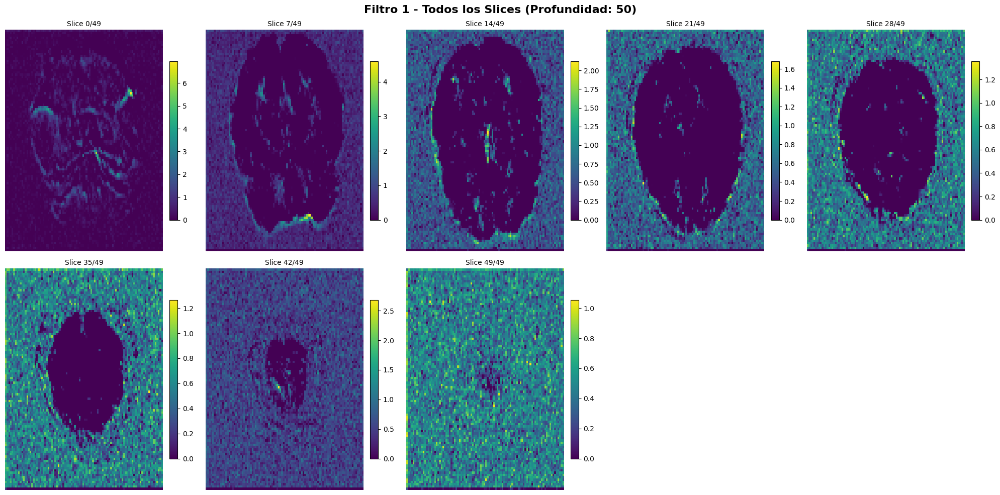

In [ ]:
visualizar_filtro_completo(activaciones, filtro_idx=1, num_slices=8)

In [ ]:
def explorar_interactivo(activaciones, filtro_idx=0):
    """
    Versión interactiva para explorar diferentes slices
    (Requiere widgets de jupyter)
    """
    from ipywidgets import interact, IntSlider

    if activaciones.dim() == 5:
        activaciones = activaciones[0]

    profundidad = activaciones.shape[1]

    @interact(slice_idx=IntSlider(min=0, max=profundidad-1, value=profundidad//2))
    def plot_slice(slice_idx):
        plt.figure(figsize=(10, 8))
        activation_slice = activaciones[filtro_idx, slice_idx, :, :].cpu().numpy()
        plt.imshow(activation_slice, cmap='viridis', aspect='auto')
        plt.colorbar()
        plt.title(f'Filtro {filtro_idx} - Slice {slice_idx}/{profundidad-1}')
        plt.axis('off')
        plt.show()

In [ ]:
explorar_interactivo(activaciones, filtro_idx=10)

interactive(children=(IntSlider(value=25, description='slice_idx', max=49), Output()), _dom_classes=('widget-i…

Evaluando modelo en conjunto de test...


Inferencia Test:   0%|          | 0/4 [00:00<?, ?it/s]


Classification Report:
              precision    recall  f1-score   support

     Control       0.53      0.71      0.61        14
    Paciente       0.50      0.31      0.38        13

    accuracy                           0.52        27
   macro avg       0.51      0.51      0.49        27
weighted avg       0.51      0.52      0.50        27



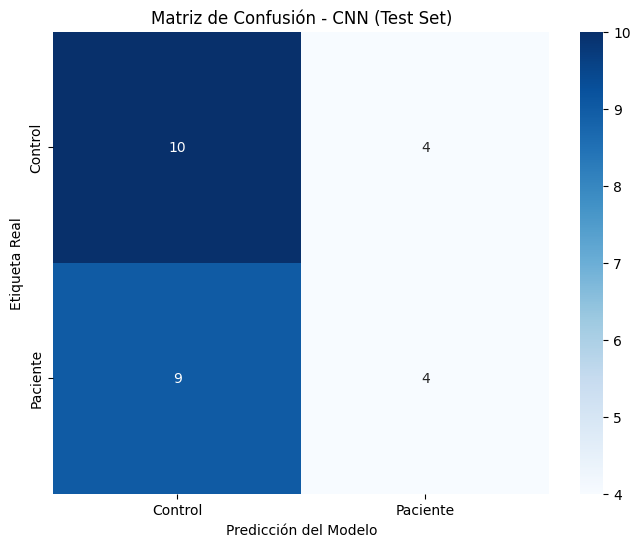

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Asegurar que el modelo esté en el dispositivo correcto (GPU si hay)
modeloImprove.to(device)

# 1. Crear DataLoader para Test
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)

# 2. Obtener predicciones
modeloImprove.eval()
y_true = []
y_pred = []

print("Evaluando modelo en conjunto de test...")
with torch.no_grad():
    for inputs, labels in tqdm(test_loader, desc="Inferencia Test"):
        inputs = inputs.to(device)
        # labels ya son tensores, solo mover a dispositivo si es necesario (aunque para metricas usamos cpu)

        outputs = modeloImprove(inputs)
        _, preds = torch.max(outputs, 1)

        y_true.extend(labels.numpy())
        y_pred.extend(preds.cpu().numpy())

# 3. Calcular Matriz de Confusión
cm = confusion_matrix(y_true, y_pred)

# 4. Imprimir Reporte
target_names = ['Control', 'Paciente']
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=target_names))

# 5. Graficar Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names,
            yticklabels=target_names)
plt.title('Matriz de Confusión - CNN (Test Set)')
plt.ylabel('Etiqueta Real')
plt.xlabel('Predicción del Modelo')
plt.show()

Buscando un paciente mal clasificado en el set de prueba...

¡Encontrado! Índice 0 | Real: Paciente (1) -> Predicho: Control (0)
Visualizando activaciones del bloque 1 (Slice 27)...


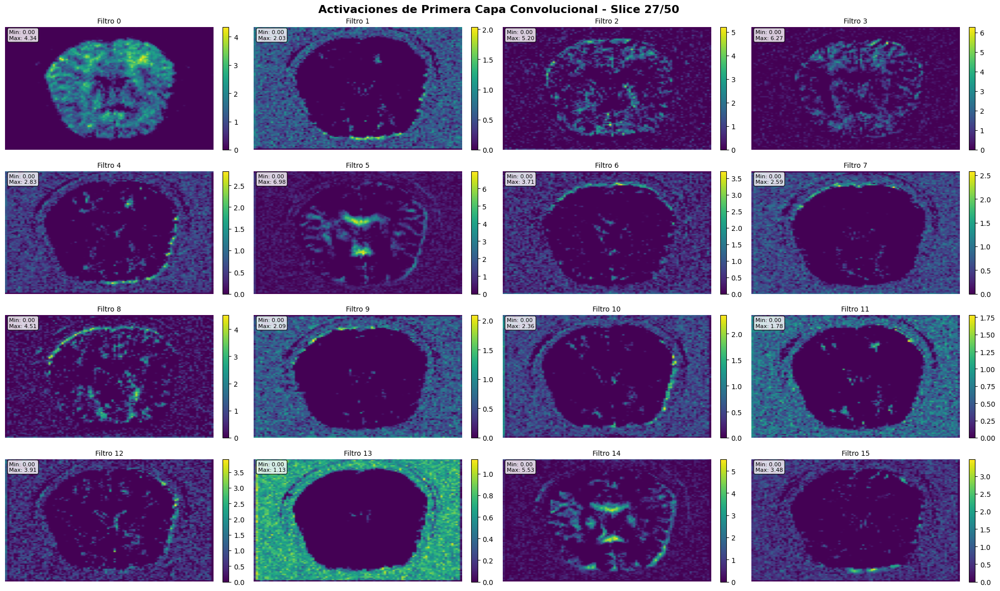

Comparando Input vs Filtro 21 (el de mayor activación media)...


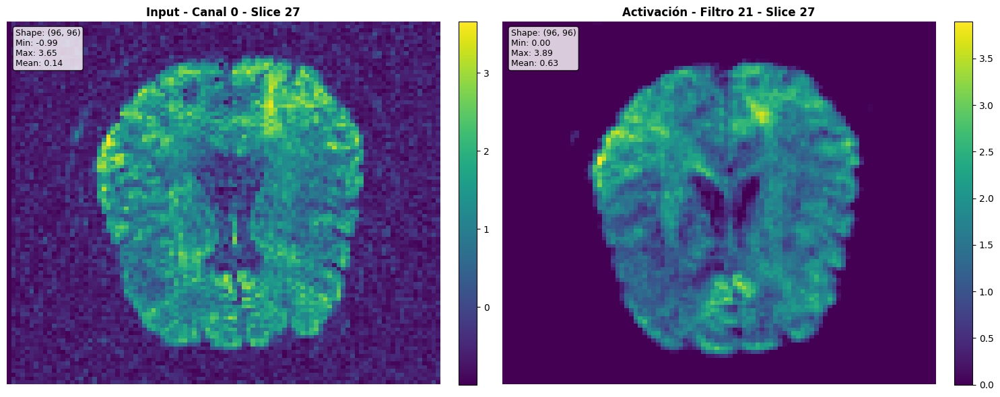

In [ ]:
# Buscar un paciente (label=1) mal clasificado (pred=0)
found_misclassified = False

modeloImprove.eval()

print("Buscando un paciente mal clasificado en el set de prueba...")

with torch.no_grad():
    for i in range(len(test_ds)):
        vol, label = test_ds[i]

        # Solo nos interesan los Pacientes (1)
        if label == 1:
            # Preparar input (1, C, D, H, W)
            input_tensor = vol.unsqueeze(0).to(device)

            # Inferencia
            outputs = modeloImprove(input_tensor)
            _, pred = torch.max(outputs, 1)
            pred = pred.item()

            # Verificar si está mal clasificado (predicción = 0)
            if pred == 0:
                print(f"\n¡Encontrado! Índice {i} | Real: Paciente (1) -> Predicho: Control (0)")

                # 1. Obtener activaciones
                activaciones_mis = obtener_activaciones_capa(modeloImprove, input_tensor, layer_name='block1')

                # 2. Visualizar slice central
                slice_idx = activaciones_mis.shape[2] // 2
                slice_idx += 2
                print(f"Visualizando activaciones del bloque 1 (Slice {slice_idx})...")
                visualizar_activaciones_por_slice(activaciones_mis, slice_idx=slice_idx, max_filtros=16)

                # 3. Comparar input original vs un filtro destacado
                # Buscamos el filtro con mayor activación promedio para ver qué detectó
                mean_acts = activaciones_mis[0].mean(dim=(1,2,3))
                best_filter = torch.argmax(mean_acts).item()

                print(f"Comparando Input vs Filtro {best_filter} (el de mayor activación media)...")
                comparar_input_vs_activaciones(vol, activaciones_mis,
                                               slice_idx=slice_idx,
                                               filtro_idx=best_filter)

                found_misclassified = True
                break

if not found_misclassified:
    print("No se encontraron pacientes mal clasificados en el conjunto de test (¡o el modelo es perfecto en esta clase!).")

Buscando un paciente correctamente clasificado en el set de prueba...

¡Encontrado! Índice 3 | Real: Paciente (1) -> Predicho: Paciente (1)
Visualizando activaciones del bloque 1 (Slice 25)...


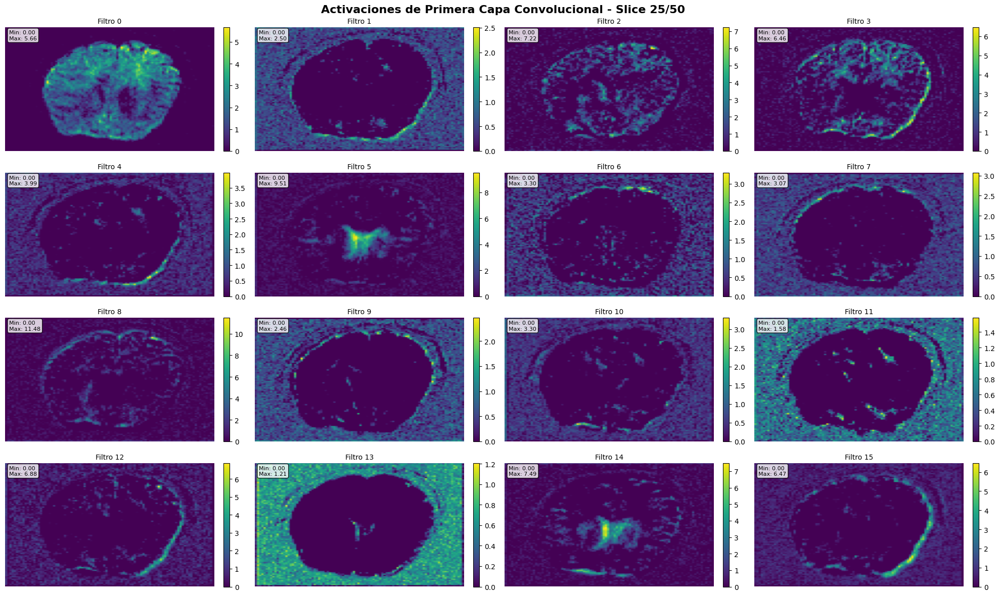

Comparando Input vs Filtro 19 (el de mayor activación media)...


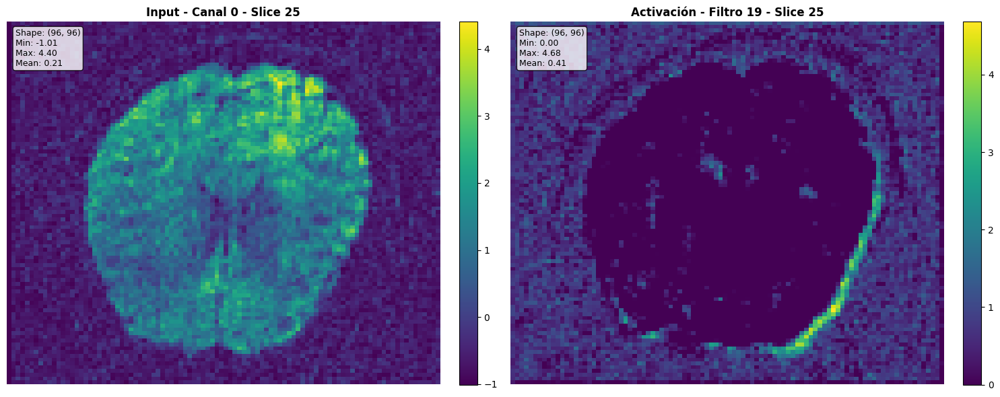

In [ ]:
# Buscar un paciente (label=1) BIEN clasificado (pred=1)
found_correct = False

modeloImprove.eval()

print("Buscando un paciente correctamente clasificado en el set de prueba...")

with torch.no_grad():
    for i in range(len(test_ds)):
        vol, label = test_ds[i]

        # Solo nos interesan los Pacientes (1)
        if label == 1:
            # Preparar input (1, C, D, H, W)
            input_tensor = vol.unsqueeze(0).to(device)

            # Inferencia
            outputs = modeloImprove(input_tensor)
            _, pred = torch.max(outputs, 1)
            pred = pred.item()

            # Verificar si está BIEN clasificado (predicción = 1)
            if pred == 1:
                print(f"\n¡Encontrado! Índice {i} | Real: Paciente (1) -> Predicho: Paciente (1)")

                # 1. Obtener activaciones
                activaciones_corr = obtener_activaciones_capa(modeloImprove, input_tensor, layer_name='block1')

                # 2. Visualizar slice central
                slice_idx = activaciones_corr.shape[2] // 2
                print(f"Visualizando activaciones del bloque 1 (Slice {slice_idx})...")
                visualizar_activaciones_por_slice(activaciones_corr, slice_idx=slice_idx, max_filtros=16)

                # 3. Comparar input original vs un filtro destacado
                mean_acts = activaciones_corr[0].mean(dim=(1,2,3))
                best_filter = torch.argmax(mean_acts).item()

                print(f"Comparando Input vs Filtro {best_filter} (el de mayor activación media)...")
                comparar_input_vs_activaciones(vol, activaciones_corr,
                                               slice_idx=slice_idx,
                                               filtro_idx=best_filter)

                found_correct = True
                break

if not found_correct:
    print("No se encontraron pacientes correctamente clasificados en el conjunto de test.")

Extrayendo representaciones internas (embeddings) del Test Set...


Extrayendo features:   0%|          | 0/4 [00:00<?, ?it/s]

Calculando t-SNE...


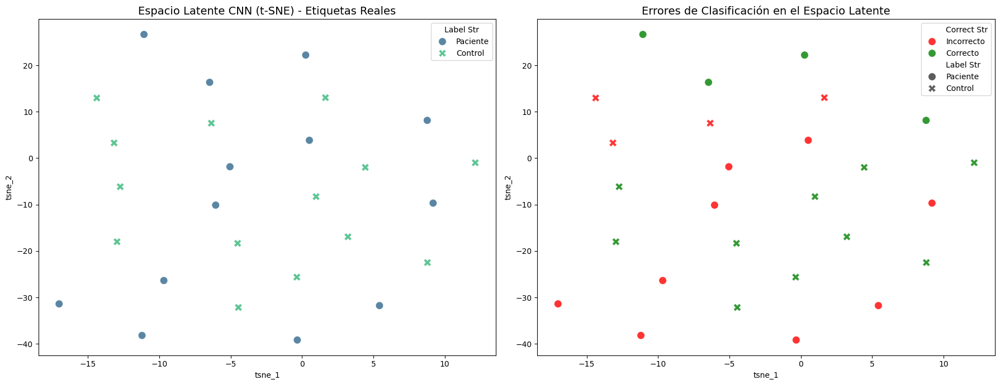

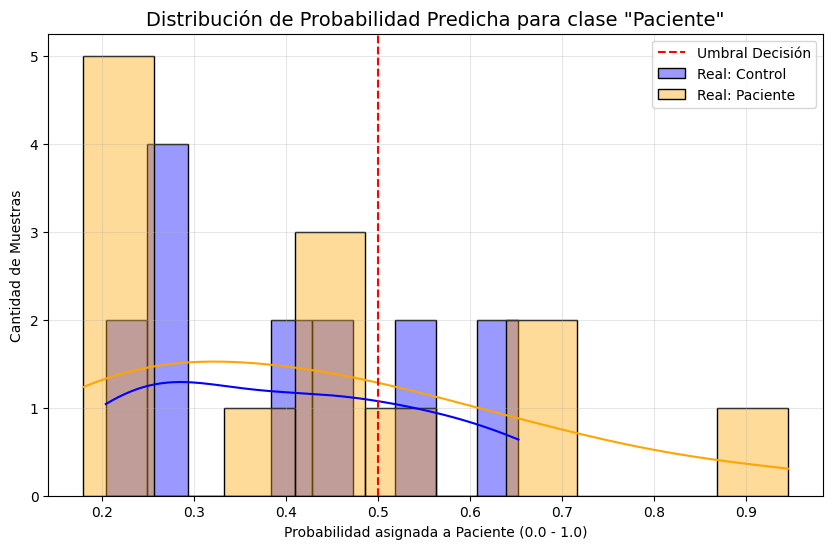

In [ ]:
from sklearn.manifold import TSNE
import torch.nn.functional as F

def extract_embeddings_and_probs(model, loader, device):
    """
    Extrae los embeddings (features antes del clasificador) y las probabilidades.
    """
    model.eval()
    embeddings = []
    probs = []
    true_labels = []

    with torch.no_grad():
        for inputs, labels in tqdm(loader, desc="Extrayendo features"):
            inputs = inputs.to(device)

            # Simular forward pass manualmente para obtener features intermedios
            x = model.block1(inputs)
            x = model.block2(x)
            x = model.block3(x)
            x = model.block4(x)
            x = model.global_pool(x)
            feat = torch.flatten(x, 1) # (B, 256)

            # Clasificación
            logits = model.classifier(feat)
            probabilities = F.softmax(logits, dim=1)

            embeddings.append(feat.cpu().numpy())
            probs.append(probabilities.cpu().numpy())
            true_labels.extend(labels.numpy())

    return np.vstack(embeddings), np.vstack(probs), np.array(true_labels)

# 1. Extraer datos del test set
print("Extrayendo representaciones internas (embeddings) del Test Set...")
X_embed, Y_probs, Y_true = extract_embeddings_and_probs(modeloImprove, test_loader, device)

# 2. Calcular t-SNE
print("Calculando t-SNE...")
tsne = TSNE(n_components=2, random_state=42, perplexity=20, init='pca', learning_rate='auto')
X_tsne = tsne.fit_transform(X_embed)

# 3. Visualizar t-SNE
df_tsne_cnn = pd.DataFrame(X_tsne, columns=['tsne_1', 'tsne_2'])
df_tsne_cnn['Label'] = Y_true
df_tsne_cnn['Label Str'] = df_tsne_cnn['Label'].map({0: 'Control', 1: 'Paciente'})
df_tsne_cnn['Pred Label'] = np.argmax(Y_probs, axis=1)
df_tsne_cnn['Correct'] = df_tsne_cnn['Label'] == df_tsne_cnn['Pred Label']
df_tsne_cnn['Correct Str'] = df_tsne_cnn['Correct'].map({True: 'Correcto', False: 'Incorrecto'})

fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Plot A: Real Labels
sns.scatterplot(data=df_tsne_cnn, x='tsne_1', y='tsne_2', hue='Label Str', style='Label Str',
                palette='viridis', s=100, alpha=0.8, ax=axes[0])
axes[0].set_title('Espacio Latente CNN (t-SNE) - Etiquetas Reales', fontsize=14)

# Plot B: Correct vs Incorrect
sns.scatterplot(data=df_tsne_cnn, x='tsne_1', y='tsne_2', hue='Correct Str', style='Label Str',
                palette={'Correcto': 'green', 'Incorrecto': 'red'}, s=100, alpha=0.8, ax=axes[1])
axes[1].set_title('Errores de Clasificación en el Espacio Latente', fontsize=14)

plt.tight_layout()
plt.show()

# 4. Histograma de Confianza (Probabilidades)
prob_paciente = Y_probs[:, 1] # Probabilidad asignada a la clase 1 (Paciente)

plt.figure(figsize=(10, 6))

# Histogramas superpuestos
sns.histplot(prob_paciente[Y_true==0], color='blue', label='Real: Control', kde=True, bins=10, alpha=0.4)
sns.histplot(prob_paciente[Y_true==1], color='orange', label='Real: Paciente', kde=True, bins=10, alpha=0.4)

plt.axvline(0.5, color='red', linestyle='--', label='Umbral Decisión')
plt.title('Distribución de Probabilidad Predicha para clase "Paciente"', fontsize=14)
plt.xlabel('Probabilidad asignada a Paciente (0.0 - 1.0)')
plt.ylabel('Cantidad de Muestras')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

Buscando ejemplo correctamente clasificado...
Ejemplo encontrado: Índice 2 (Clase 0)


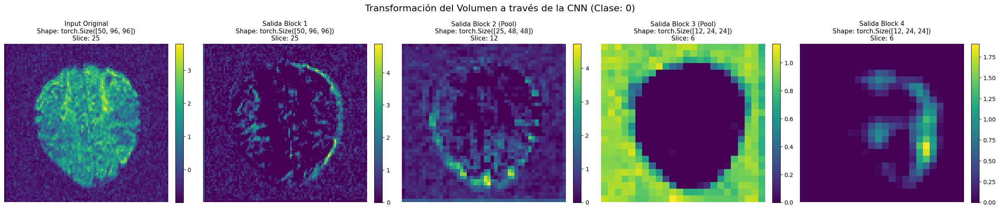

In [ ]:
def visualizar_transformacion_red(model, dataset, device):
    """
    Toma un ejemplo correctamente clasificado y visualiza su paso por todos los bloques.
    """
    model.eval()

    # 1. Buscar un ejemplo correctamente clasificado
    found = False
    input_tensor = None
    label_real = None

    print("Buscando ejemplo correctamente clasificado...")
    for i in range(len(dataset)):
        vol, label = dataset[i]
        t_in = vol.unsqueeze(0).to(device)

        with torch.no_grad():
            out = model(t_in)
            _, pred = torch.max(out, 1)

        if pred.item() == label:
            input_tensor = t_in
            label_real = label
            found = True
            print(f"Ejemplo encontrado: Índice {i} (Clase {label})")
            break

    if not found:
        print("No se encontró ejemplo.")
        return

    # 2. Extraer activaciones secuenciales
    with torch.no_grad():
        # Input
        x = input_tensor

        # Block 1
        out_b1 = model.block1(x)

        # Block 2
        out_b2 = model.block2(out_b1)

        # Block 3
        out_b3 = model.block3(out_b2)

        # Block 4
        out_b4 = model.block4(out_b3)

    # 3. Visualizar
    stages = [
        ('Input Original', x, 0), # Canal 0 del input
        ('Salida Block 1', out_b1, 5), # Filtro 5
        ('Salida Block 2 (Pool)', out_b2, 5),
        ('Salida Block 3 (Pool)', out_b3, 5),
        ('Salida Block 4', out_b4, 5)
    ]

    fig, axes = plt.subplots(1, 5, figsize=(24, 5))
    fig.suptitle(f'Transformación del Volumen a través de la CNN (Clase: {label_real})', fontsize=16)

    for idx, (name, tensor, filter_idx) in enumerate(stages):
        # Seleccionar slice central en profundidad
        d_dim = tensor.shape[2]
        slice_idx = d_dim // 2

        # Extraer mapa de características (Batch, Canal, D, H, W)
        # Seleccionamos el filtro indicado (o canal 0 para input)
        if tensor.shape[1] > filter_idx:
            feature_map = tensor[0, filter_idx, slice_idx, :, :].cpu().numpy()
        else:
            feature_map = tensor[0, 0, slice_idx, :, :].cpu().numpy()

        ax = axes[idx]
        im = ax.imshow(feature_map, cmap='viridis', aspect='auto')
        ax.set_title(f"{name}\nShape: {tensor.shape[2:]}\nSlice: {slice_idx}", fontsize=11)
        ax.axis('off')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plt.tight_layout()
    plt.show()

# Ejecutar visualización
visualizar_transformacion_red(modeloImprove, test_ds, device)

Buscando ejemplo correctamente clasificado...
Ejemplo encontrado: Índice 2 (Clase 1)


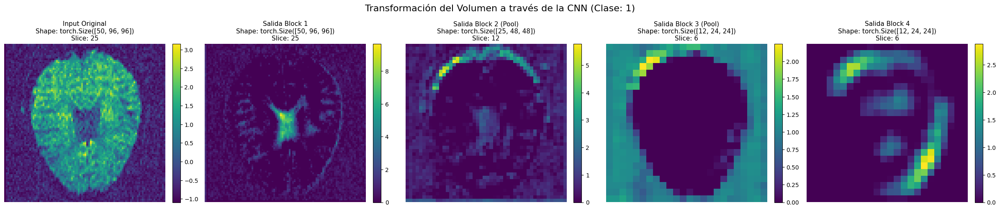

In [ ]:
visualizar_transformacion_red(modeloImprove, val_ds, device)